In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df = pd.read_pickle("../data/train_df.pkl")

In [3]:
df.shape

(170884, 31)

In [4]:
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
109011,71174.0,-2.108259,1.173406,1.614294,0.482867,0.067209,-0.191013,0.191246,-1.705859,-0.177615,...,1.520624,-0.388595,0.260114,0.340667,0.400474,-0.413089,-0.348291,0.215298,19.99,0.0
280683,169683.0,2.313997,-1.311064,-1.421228,-1.724356,-1.003480,-0.912621,-0.898765,-0.221952,-1.658076,...,0.089446,0.664605,0.029245,-0.347503,0.069152,0.074159,-0.024483,-0.076422,15.00,0.0
158318,111127.0,2.104946,0.155284,-1.402870,0.311489,0.504248,-0.690870,0.138943,-0.417801,1.894584,...,0.107745,0.759527,-0.022144,0.465282,0.402861,-0.478955,-0.016524,-0.053868,1.00,0.0
243733,152052.0,2.072408,-0.015687,-1.310880,0.373435,-0.063476,-1.380722,0.243699,-0.394350,0.631048,...,0.243262,0.858393,0.003403,0.077370,0.259102,-0.110464,-0.021166,-0.058972,1.99,0.0
177016,123008.0,2.046409,0.156335,-2.006987,0.384525,0.604029,-0.756561,0.232367,-0.230789,0.072474,...,0.326565,1.165945,-0.109465,0.793698,0.377195,0.837559,-0.075171,-0.053246,1.57,0.0


In [5]:
df.groupby('Class').size()

Class
0.0    170589
1.0       295
dtype: int64

In [6]:
df.info()

<class 'pandas.DataFrame'>
Index: 170884 entries, 109011 to 17677
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    170884 non-null  float64
 1   V1      170884 non-null  float64
 2   V2      170884 non-null  float64
 3   V3      170884 non-null  float64
 4   V4      170884 non-null  float64
 5   V5      170884 non-null  float64
 6   V6      170884 non-null  float64
 7   V7      170884 non-null  float64
 8   V8      170884 non-null  float64
 9   V9      170884 non-null  float64
 10  V10     170884 non-null  float64
 11  V11     170884 non-null  float64
 12  V12     170884 non-null  float64
 13  V13     170884 non-null  float64
 14  V14     170884 non-null  float64
 15  V15     170884 non-null  float64
 16  V16     170884 non-null  float64
 17  V17     170884 non-null  float64
 18  V18     170884 non-null  float64
 19  V19     170884 non-null  float64
 20  V20     170884 non-null  float64
 21  V21     170884 non-nul

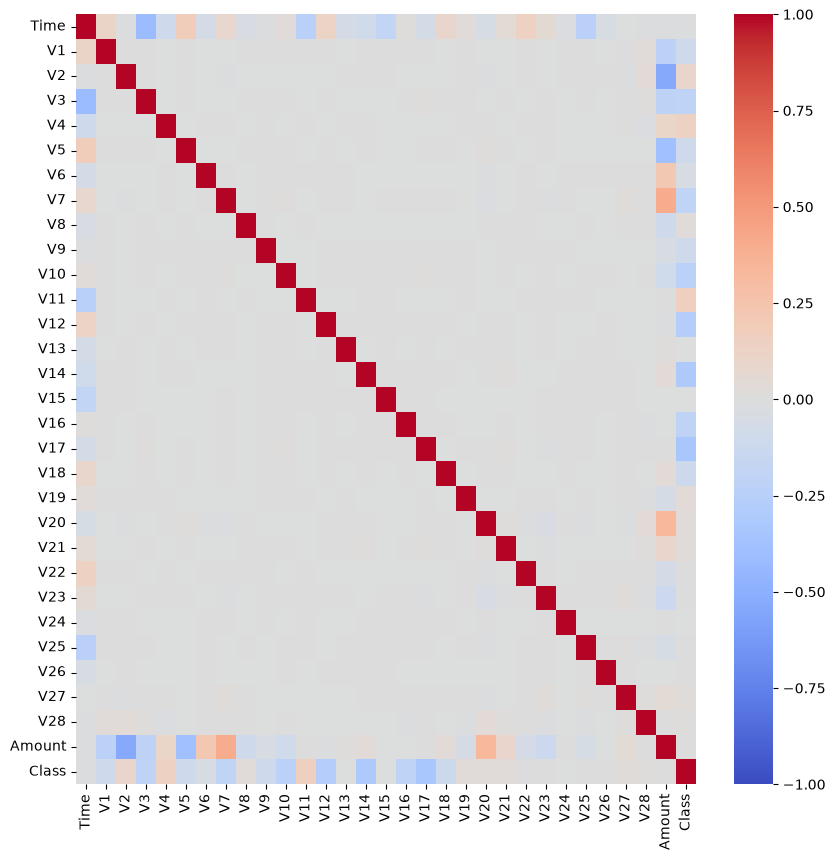

In [7]:
correlation_matrix = df.corr(numeric_only=True)

plt.figure(figsize=(10, 10))
sns.heatmap(
    correlation_matrix,
    # annot=True,
    cmap="coolwarm",
    vmin=-1,
    vmax=1
)

plt.show()

In [8]:
sns.pairplot(
    df.sample(n=250, random_state=42).reset_index(drop=True),
    hue="Class",
    height=2.5,
    diag_kind="kde",
    plot_kws={"alpha": 0.6}
)

plt.show()

# univariate variable importance

In [9]:
import statsmodels.api as sm
import pandas as pd

In [10]:
walds = pd.DataFrame(columns = ['var','wald'])

for i in df.drop(columns = 'Class').columns:
    
    # print(i)
  
    X = sm.add_constant(df[i])
    y = df["Class"]

    # Fit logistic regression
    model = sm.Logit(y, X).fit()
    
    # print(model.summary())

    wald_chi_square = model.tvalues[i] ** 2

    # print("Wald chi-square:", wald_chi_square)

    new_row = pd.DataFrame([{
        "var": i,
        "wald": wald_chi_square
    }])

    walds = pd.concat([walds, new_row], ignore_index=True)

    # break

Optimization terminated successfully.
         Current function value: 0.012620
         Iterations 11
Optimization terminated successfully.
         Current function value: 0.011309
         Iterations 11
Optimization terminated successfully.
         Current function value: 0.009983
         Iterations 11
Optimization terminated successfully.
         Current function value: 0.008710
         Iterations 11
Optimization terminated successfully.
         Current function value: 0.008238
         Iterations 12
Optimization terminated successfully.
         Current function value: 0.011340
         Iterations 11
Optimization terminated successfully.
         Current function value: 0.012019
         Iterations 11
Optimization terminated successfully.
         Current function value: 0.009469
         Iterations 11
Optimization terminated successfully.
         Current function value: 0.012365
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.

In [11]:
walds.sort_values(by = 'wald', ascending = False, inplace = True)

# correlation by importance

In [12]:
correlation_matrix = df[walds['var'].tolist()].corr(numeric_only=True)

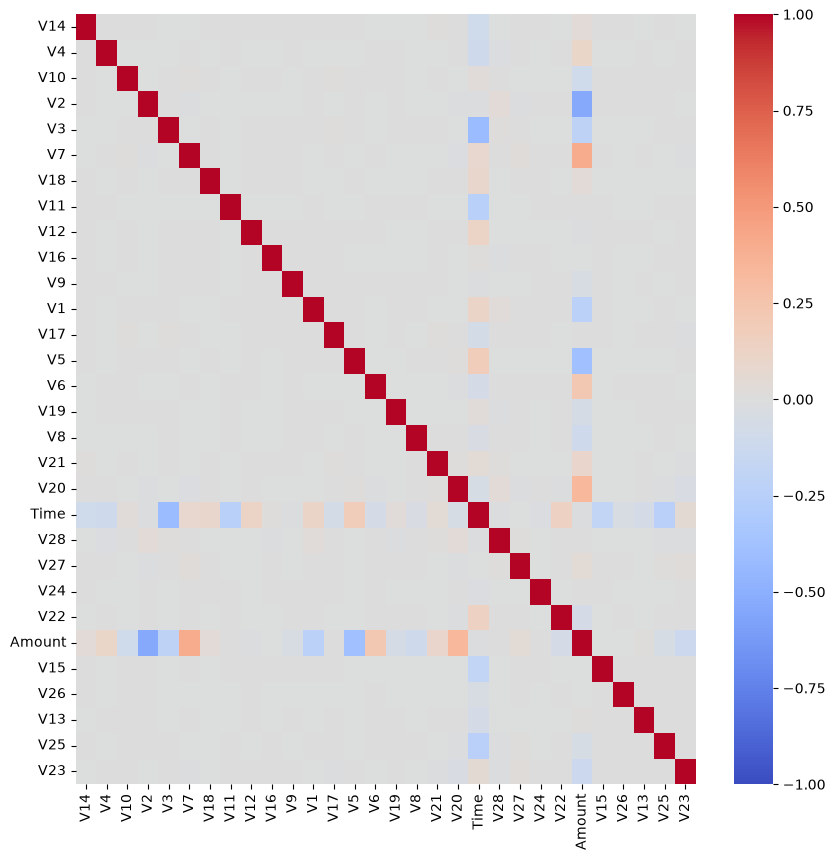

In [13]:
plt.figure(figsize=(10, 10))
sns.heatmap(
    correlation_matrix,
    # annot=True,
    cmap="coolwarm",
    vmin=-1,
    vmax=1
)

plt.show()

In [14]:
correlation_matrix.head()

,V14,V4,V10,V2,V3,V7,V18,V11,V12,V16,...,V28,V27,V24,V22,Amount,V15,V26,V13,V25,V23
V14,1.000000,0.000862,0.004165,0.000166,-0.000042,-0.000785,0.004806,0.000063,0.003612,0.003424,...,-0.002202,0.000599,0.000712,-0.005674,0.032542,0.001358,0.000340,-0.000797,0.001084,-0.006108
V4,0.000862,1.000000,-0.003485,-0.002466,-0.002882,0.001779,-0.002809,0.000875,-0.000197,-0.001940,...,-0.017757,0.001858,-0.000604,0.001329,0.105314,-0.000921,-0.001958,0.000294,-0.001016,0.002766
V10,0.004165,-0.003485,1.000000,-0.004011,0.005628,0.008536,0.001217,-0.002316,0.005973,0.005794,...,0.002665,-0.000525,-0.003366,-0.000244,-0.100605,0.000657,0.000124,0.001368,0.000709,0.005911
V2,0.000166,-0.002466,-0.004011,1.000000,0.000988,-0.008589,-0.003568,-0.000843,-0.001307,-0.001332,...,0.037486,-0.008525,0.002821,0.000219,-0.535577,0.001801,0.000272,0.000165,0.003139,-0.000530
V3,-0.000042,-0.002882,0.005628,0.000988,1.000000,-0.002031,0.002429,-0.003948,0.006137,0.003915,...,0.011394,0.000265,-0.002372,-0.002920,-0.215974,-0.000217,-0.001183,-0.000488,0.001767,0.002022


In [15]:
corr_tmp = correlation_matrix.copy()

In [16]:
corr_ind = pd.DataFrame(columns = ['var','corr','corr ind'])

thresh = .3

for i in corr_tmp.columns:
    # print(i)

    # mx = corr_tmp[i].max()
    mx = corr_tmp[i].drop(index=i).max()
    mi = corr_tmp[i].drop(index=i).min()

    if abs(mx) > abs(mi):
        res = mx
    else:
        res = mi

    

    # print(res)

    if abs(res) > thresh:
        indy = True
    else:
        indy = False

    
    new_row = pd.DataFrame([{
    "var": i,
    'corr': res,
    "corr ind": indy
    }])

    corr_ind = pd.concat([corr_ind, new_row], ignore_index=True)

    # break

In [17]:
walds = pd.merge(walds, corr_ind, on="var", how="left")

In [18]:
walds

,var,wald,corr,corr ind
0,V14,1455.634827,-0.098727,False
1,V4,1297.380483,-0.106859,False
2,V10,1183.148737,-0.100605,False
3,V2,1163.591804,-0.535577,True
4,V3,1134.292483,-0.417851,True
5,V7,1107.035839,0.403879,True
6,V18,1060.964028,0.092116,False
7,V11,1054.466072,-0.246076,False
8,V12,1034.02284,0.123215,False
9,V16,997.063574,0.012096,False


In [19]:
walds.to_pickle("../data/walds.pkl")